# Image Colorization using CNN

This is a CV project for DIT masters.

**Training dataset**: https://www.kaggle.com/datasets/aayush9753/image-colorization-dataset

## Download Dataset

In [1]:
!kaggle datasets download -d aayush9753/image-colorization-dataset

Dataset URL: https://www.kaggle.com/datasets/aayush9753/image-colorization-dataset
License(s): unknown
100%|████████████████████████████████████████▉| 473M/473M [00:04<00:00, 133MB/s]
100%|█████████████████████████████████████████| 473M/473M [00:04<00:00, 108MB/s]


In [2]:
!unzip -q image-colorization-dataset.zip

In [3]:
!echo "Train data" && ls data/train_color/ | wc -l
!echo "Test data" && ls data/test_color/ | wc -l

Train data
5000
Test data
739


## Data cleaning
Remove grayscale images from color dir

In [4]:
import os
from PIL import Image

def is_grayscale(image_path):
    """
    Check if an image is grayscale.

    Args:
        image_path (str): Path to the image file.

    Returns:
        bool: True if the image is grayscale, False otherwise.
    """
    with Image.open(image_path) as img:
        if img.mode in ('L', '1'):
            return True
        if img.mode == 'RGB':
            rgb = img.convert('RGB')
            for pixel in rgb.getdata():
                r, g, b = pixel
                if r != g or g != b:
                    return False
            return True
        return False

def clean_false_color_images(image_dir):
  false_counter = 0
  for filename in os.listdir(image_dir):
    full_path = image_dir+'/'+filename
    if is_grayscale(full_path):
      os.remove(full_path)
      false_counter += 1
  print(f"Remove {false_counter} false images.")


clean_false_color_images("data/train_color")

Remove 145 false images.


In [5]:
# plt.imshow(Image.open('data/train_black/image4997.jpg'))

## Visualization

In [6]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import random

In [7]:
# Get the list of images
color_images = sorted(os.listdir('data/train_color'))
black_images = sorted(os.listdir('data/train_black'))

# check image size
img_dir = "data/train_black"
for img in os.listdir(img_dir):
  img_path = os.path.join(img_dir, img)
  img = Image.open(img_path)
  print(img.size)
  break

(400, 400)


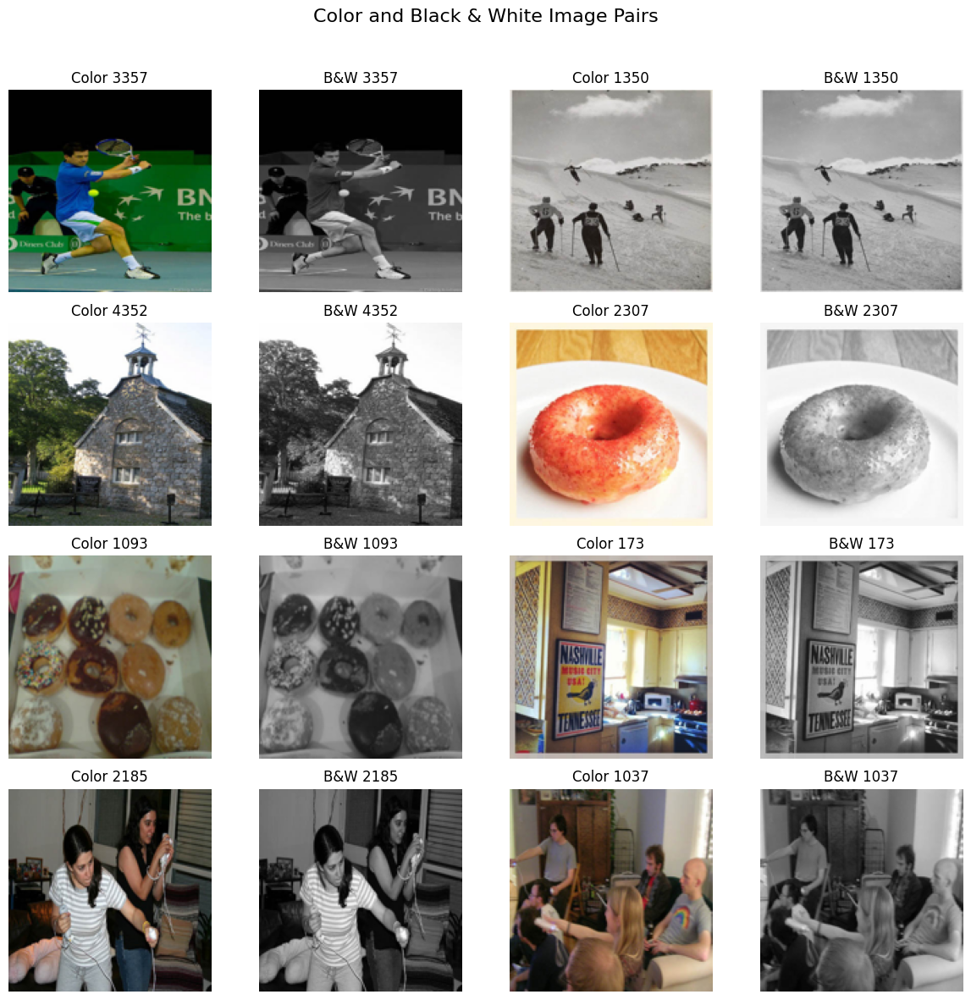

In [8]:
def visualize_images(color_dir, black_dir, num_images=4):
    """
    Visualizes pairs of color and black & white images from the specified directories.

    Parameters:
    - color_dir: Directory containing color images.
    - black_dir: Directory containing black and white images.
    - num_images: Number of image pairs to display.
    """
    # # Get the list of images
    color_images = sorted(os.listdir(color_dir))

    # Select a subset of images to display
    # display_indices = list(range(min(num_images, len(color_images))))
    display_indices = random.sample(range(len(color_images)), min(num_images, len(color_images)))
    # Calculate number of rows needed for four columns
    num_rows = (2*num_images + 3) // 4  # 2*num_images for color+bw images

    # Set up the plot
    fig, axes = plt.subplots(num_rows, 4, figsize=(12, 3 * num_rows))
    fig.suptitle('Color and Black & White Image Pairs', fontsize=16)

    for i, idx in enumerate(display_indices):
        row = i // 2
        col = (i % 2) * 2  # keeps the indices within [0,2] and maintain gap

        img_filename = color_images[idx]
        color_img_path = os.path.join(color_dir, img_filename)
        black_img_path = os.path.join(black_dir, img_filename)

        # Load the images
        color_img = Image.open(color_img_path)
        black_img = Image.open(black_img_path)

        # Resize images to smaller dimensions
        color_img.thumbnail((150, 150))
        black_img.thumbnail((150, 150))

        # Display color image
        axes[row, col].imshow(color_img)
        axes[row, col].axis('off')
        axes[row, col].set_title(f'Color {idx + 1}')

        # Display black & white image
        axes[row, col + 1].imshow(black_img, cmap='gray')
        axes[row, col + 1].axis('off')
        axes[row, col + 1].set_title(f'B&W {idx + 1}')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top to fit the suptitle
    plt.show()


# Usage
visualize_images('data/train_color', 'data/train_black', num_images=8)

# Modeling

Steps:
1. Define Custom Dataset
2. Create Dataloaders
3. Build Network
4. Define Train loop
5. Define hyperparameters
6. Run training

In [9]:
import os
import pandas as pd
from torchvision.io import read_image, ImageReadMode
from torchvision import transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import SubsetRandomSampler
import torch
from torch import from_numpy
from skimage.color import rgb2lab, lab2rgb
import cv2

## Define Custom Dataset

In [10]:
TRAIN_BLACK_DIR = "data/train_black"
TRAIN_COLOR_DIR = "data/train_color"

TEST_BLACK_DIR = "data/test_black"
TEST_COLOR_DIR = "data/test_color"

In [11]:
class UnetImageDataset(Dataset):
    def __init__(self, color_img_dir, transform=None, target_transform=None):
        self.color_img_dir = color_img_dir
        # list of images filenames
        self.images_list = os.listdir(self.color_img_dir)
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, idx):
        # convert RGB color image to LAB format
        color_img = cv2.imread(os.path.join(self.color_img_dir, self.images_list[idx]))

        # Convert the image from BGR to RGB
        color_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB)

        # resize
        image_resized = cv2.resize(color_img, (256, 256))
#         image_resized = color_img

        # change color space
        lab_img = rgb2lab(image_resized)
        lab_img = from_numpy(lab_img).permute(2, 0, 1)
        # take l and ab channels
        color_img = lab_img[1:, :, :]
        black_img = lab_img[0, :, :].unsqueeze(0) # add 1 dimension at the start
        
        # normalization (didn't work)
#         black_img = black_img / 100.0
#         color_img = (color_img + 128) / 255.0 * 2 - 1
        
        return black_img.float(), color_img.float()

## Create Dataloaders

In [12]:
train_dataset = UnetImageDataset(TRAIN_COLOR_DIR)
test_dataset = UnetImageDataset(TEST_COLOR_DIR)

# create train-val dataloader from single dataset using sampler
train_split = 0.8
train_end_index = int(len(train_dataset)*train_split)
train_indices = range(train_end_index)
val_indices = range(train_end_index, len(train_dataset))
# train_indices = range(200)
# val_indices = range(200,300)

train_dataloader = DataLoader(train_dataset, batch_size=32, sampler=SubsetRandomSampler(train_indices))
val_dataloader = DataLoader(train_dataset, batch_size=32, sampler=SubsetRandomSampler(val_indices))
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=True)

In [13]:
len(train_dataset), len(train_dataloader), len(val_dataloader), len(test_dataloader)

(4855, 122, 31, 24)

In [14]:
# next(iter(val_dataloader))[1][0]

In [15]:
# net(iter(val_dataloader))

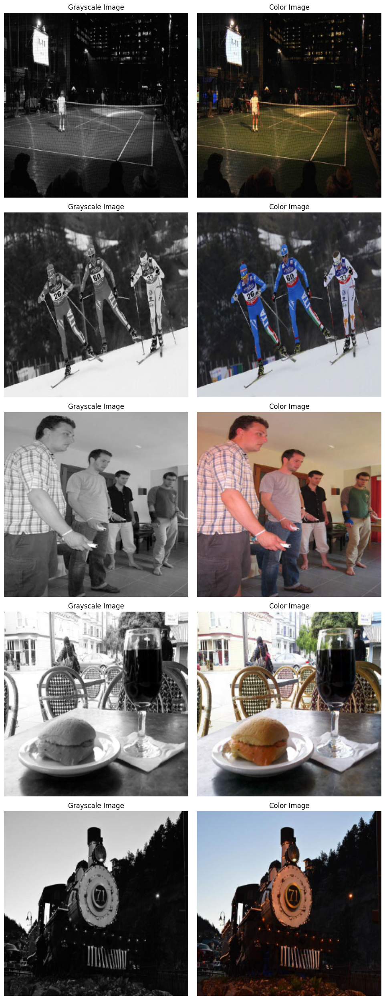

In [16]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_dataloader(dataloader, num_images=5):
    """
    Visualize pairs of grayscale and color images from the dataloader.

    Args:
    - dataloader (torch.utils.data.DataLoader): Dataloader providing (grayscale, color) image pairs.
    - num_images (int): Number of image pairs to visualize.
    """
    # Get a batch of images from the dataloader
    grayscale_images, color_images = next(iter(dataloader))
    
    # denormalize color images
#     grayscale_images = grayscale_images * 100.0
#     color_images=(color_images + 1) * 0.5 * 255.0 - 128.0

    # convert LAB color images to RGB
    lab_images = torch.cat((grayscale_images, color_images), 1)
    color_images = lab2rgb(lab_images.permute(0, 2, 3, 1)) # Convert from (N, C, H, W) to (N, H, W, C)


    # Convert tensors to numpy arrays and squeeze to remove channel dimensions for grayscale images
    grayscale_images = grayscale_images.numpy().squeeze(axis=1)

    # Create a figure
    fig, axes = plt.subplots(num_images, 2, figsize=(10, 5 * num_images))

    for i in range(num_images):
        # Plot grayscale image
        axes[i, 0].imshow(grayscale_images[i], cmap='gray')
        axes[i, 0].set_title("Grayscale Image")
        axes[i, 0].axis('off')

        # Plot color image
        axes[i, 1].imshow(color_images[i])
        axes[i, 1].set_title("Color Image")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming `dataloader` is your DataLoader object
visualize_dataloader(val_dataloader, num_images=5)

## Build Network

In [17]:
import torch.nn as nn
import torch.nn.functional as F
from torch import cat
class Unet(nn.Module):
    def __init__(self):
        """
        Initializes CNN blocks.
        """
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=4, stride=2, padding=1)
        self.conv1_bn = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1)
        self.conv2_bn = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.conv3_bn = nn.BatchNorm2d(128)
        self.conv4 = nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1)
        self.conv4_bn = nn.BatchNorm2d(256)

        # Dilation layers. (gap between kernel columns)
        self.conv5 = nn.Conv2d(256, 256, kernel_size=4, stride=1, padding=3, dilation=2)
        self.conv5_bn = nn.BatchNorm2d(256)
        self.conv6 = nn.Conv2d(256, 256, kernel_size=4, stride=1, padding=3, dilation=2)
        self.conv6_bn = nn.BatchNorm2d(256)

        # decoder blocks
        self.t_conv1 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.t_conv1_bn = nn.BatchNorm2d(128)
        self.t_conv2 = nn.ConvTranspose2d(256, 64, kernel_size=4, stride=2, padding=1)
        self.t_conv2_bn = nn.BatchNorm2d(64)
        self.t_conv3 = nn.ConvTranspose2d(128, 32, kernel_size=4, stride=2, padding=1)
        self.t_conv3_bn = nn.BatchNorm2d(32)
        self.t_conv4 = nn.ConvTranspose2d(64, 2, kernel_size=4, stride=2, padding=1)

        self.output = nn.Conv2d(3, 2, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        """
        Implements the forward pass for the given data `x`.
        :param x: The input data.
        :return: The neural network output.
        """
        x_1 = F.relu(self.conv1_bn(self.conv1(x)))
        x_2 = F.relu(self.conv2_bn(self.conv2(x_1)))
        x_3 = F.relu(self.conv3_bn(self.conv3(x_2)))
        x_4 = F.relu(self.conv4_bn(self.conv4(x_3)))

        # Dilation layers.
        x_5 = F.relu(self.conv5_bn(self.conv5(x_4)))
        x_5_d = F.relu(self.conv6_bn(self.conv6(x_5)))

        x_6 = F.relu(self.t_conv1_bn(self.t_conv1(x_5_d)))
        x_6 = cat((x_6, x_3), 1)
        x_7 = F.relu(self.t_conv2_bn(self.t_conv2(x_6)))
        x_7 = cat((x_7, x_2), 1)
        x_8 = F.relu(self.t_conv3_bn(self.t_conv3(x_7)))
        x_8 = cat((x_8, x_1), 1)
        x_9 = F.relu(self.t_conv4(x_8))
        x_9 = cat((x_9, x), 1)
        x = self.output(x_9)
        return x

### Visualize Network

In [18]:
! pip install -q torchview

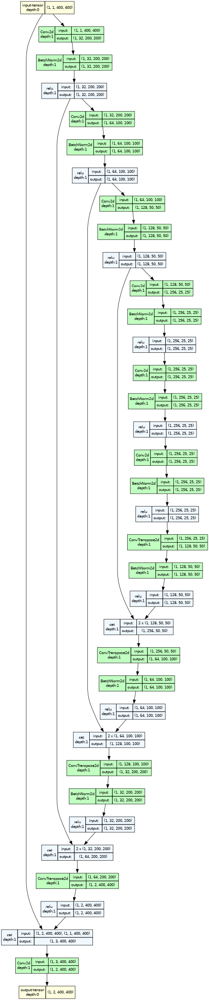

In [19]:
from torchview import draw_graph
import graphviz
graphviz.set_jupyter_format('png')
model_graph1 = draw_graph(Unet(), input_size=(1,1,400,400))
model_graph1.visual_graph

## Define Hyperparameters

In [20]:
import torch
model = Unet()
# hyperparameters
learning_rate = 1e-3
batch_size = 96

# Initialize the loss function
loss_fn = nn.MSELoss()

# define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0.001)

# get device
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [21]:
print(f"model params: {sum(p.numel() for p in model.parameters())}")

model params: 3643514


## Define training loop

In [22]:
def train_loop(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    train_loss = 0
    # Set the model to training mode - important for batch normalization and dropout layers
    model.train()
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)
        # reset gradients
        optimizer.zero_grad()
        # Compute prediction and loss
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        loss.backward()
        # Gradient clipping
#         torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        # update gradients
        optimizer.step()
        
        train_loss += loss_fn(pred, y).item()

#         if batch % 5 == 0:
#             loss, current = loss.item(), batch * batch_size + len(X)
#             print(f"training loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")
    avg_train_loss = train_loss/num_batches
#     print(f"Avg train loss: {avg_train_loss:>8f} \n")
    return avg_train_loss


def test_loop(dataloader, model, loss_fn):
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()

    avg_train_loss = test_loss/num_batches

#     print(f"Avg test loss: {avg_train_loss:>8f} \n")
    return avg_train_loss

## Run training

In [23]:
epochs = 100
best_val_loss = 1e5
model = model.to(device)

train_losses = []
val_losses = []
for t in range(epochs):
    train_loss = train_loop(train_dataloader, model, loss_fn, optimizer)
    val_loss = test_loop(val_dataloader, model, loss_fn)
    # save best validation weights
    if best_val_loss > val_loss:
        best_val_loss = val_loss
        print("Saving weights with best val loss.")
        torch.save(model.state_dict(), 'best_val_weights')
    # track train/val losses
    train_losses.append(train_loss)
    val_losses.append(val_loss)
        
print("Done!")

Saving weights with best val loss.
Saving weights with best val loss.
Saving weights with best val loss.
Saving weights with best val loss.
Saving weights with best val loss.
Saving weights with best val loss.
Saving weights with best val loss.
Saving weights with best val loss.
Saving weights with best val loss.
Done!


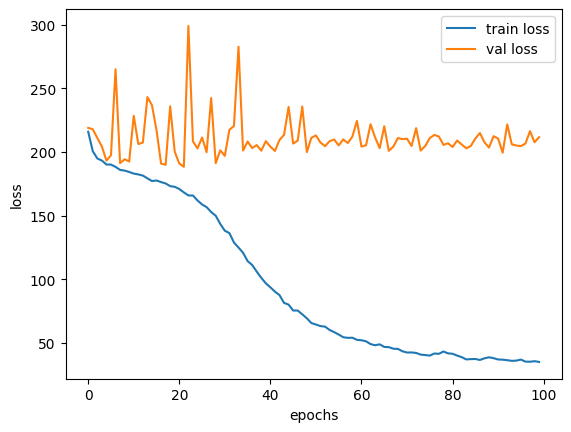

In [24]:
import matplotlib.pyplot as plt
plt.plot(train_losses, label="train loss")
plt.plot(val_losses, label="val loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend(loc="upper right")
plt.show()

In [25]:
test_loop(test_dataloader, model, loss_fn)

189.77893288930258

## Save and Load model

In [26]:
#save
torch.save(model.state_dict(), 'final_model_weights')
#load
# model = Network6()
# model.load_state_dict(torch.load('/kaggle/input/cnn-colorization/pytorch/best6/1/cnn_6th_2000_full.pt')['model_state_dict'])
# model.eval()

## Test

/tmp/ipykernel_24/1133707526.py:29: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 14 negative Z values that have been clipped to zero
  color_images = lab2rgb(lab_images.permute(0, 2, 3, 1)) # Convert from (N, C, H, W) to (N, H, W, C)


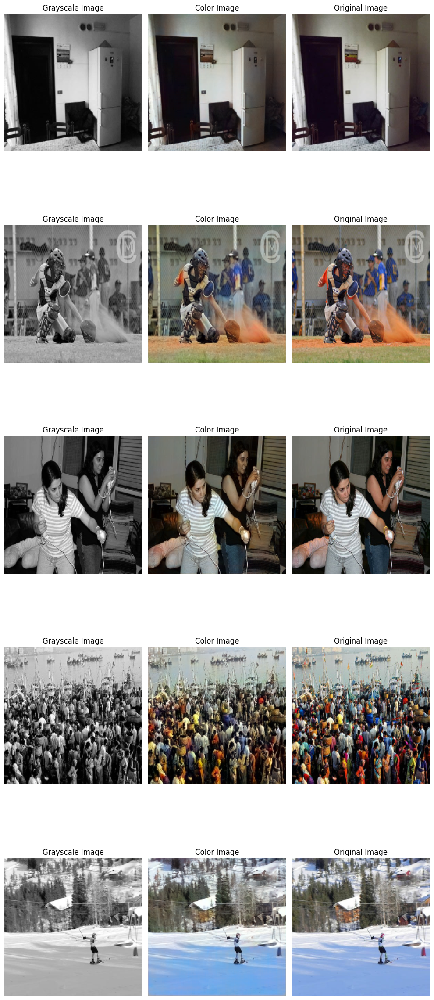

In [27]:
import matplotlib.pyplot as plt
import numpy as np

def test_visualize_dataloader(dataloader, model, num_images=5):
    """
    Visualize pairs of grayscale and color images from the dataloader.

    Args:
    - dataloader (torch.utils.data.DataLoader): Dataloader providing (grayscale, color) image pairs.
    - model: pytorch model
    - num_images (int): Number of image pairs to visualize.
    """
    # Get a batch of images from the dataloader
    grayscale_images, original_images = next(iter(dataloader))
    
    model.eval()
    model.to('cpu')
    color_images = model(grayscale_images).detach().cpu()
    
    # denormalize color images
#     grayscale_images = grayscale_images * 100.0
#     color_images=(color_images + 1) * 0.5 * 255.0 - 128.0
#     original_images=(original_images + 1) * 0.5 * 255.0 - 128.0
    

    
    # convert LAB color images to RGB
    lab_images = torch.cat((grayscale_images, color_images), 1)
    color_images = lab2rgb(lab_images.permute(0, 2, 3, 1)) # Convert from (N, C, H, W) to (N, H, W, C)
    
    orig_lab_images = torch.cat((grayscale_images, original_images), 1)
    original_images = lab2rgb(orig_lab_images.permute(0, 2, 3, 1))


    # Convert tensors to numpy arrays and squeeze to remove channel dimensions for grayscale images
    grayscale_images = grayscale_images.numpy().squeeze(axis=1)

    # Create a figure
    fig, axes = plt.subplots(num_images, 3, figsize=(10, 5 * num_images))

    for i in range(num_images):
        # Plot grayscale image
        axes[i, 0].imshow(grayscale_images[i], cmap='gray')
        axes[i, 0].set_title("Grayscale Image")
        axes[i, 0].axis('off')

        # Plot color image
        axes[i, 1].imshow(color_images[i])
        axes[i, 1].set_title("Color Image")
        axes[i, 1].axis('off')
        
        # Plot original image
        axes[i, 2].imshow(original_images[i])
        axes[i, 2].set_title("Original Image")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming `dataloader` is your DataLoader object
test_visualize_dataloader(train_dataloader, model, num_images=5)

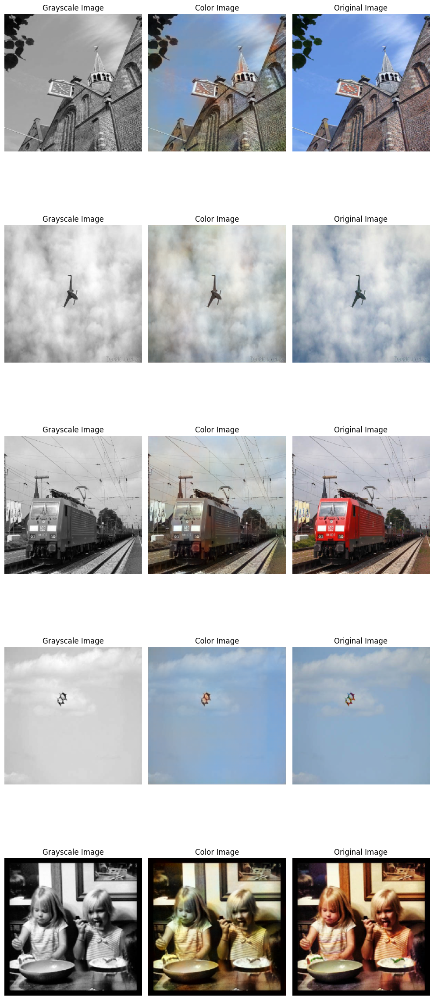

In [28]:
test_visualize_dataloader(val_dataloader, model, num_images=5)

In [29]:
gray_img = cv2.imread(f"{TEST_BLACK_DIR}/image5029.jpg")
# gray_img = cv2.resize(gray_img, (256, 256))
image_lab = cv2.cvtColor(gray_img, cv2.COLOR_BGR2RGB)
image_lab = rgb2lab(image_lab)


print(gray_img.shape)
pred_img = model(from_numpy(image_lab[:,:,0]).unsqueeze(-1).permute(2,0,1).unsqueeze(0).float())
pred_img = pred_img[0].permute(1,2,0).detach().numpy()
pred_img = np.clip(pred_img, -128, 128)


color_img = np.concatenate((np.expand_dims(image_lab[:,:,0], axis=-1), pred_img), axis=-1)
# rgb_img = cv2.cvtColor(color_img, cv2.COLOR_LAB2RGB)
rgb_img = lab2rgb(color_img)

(400, 400, 3)


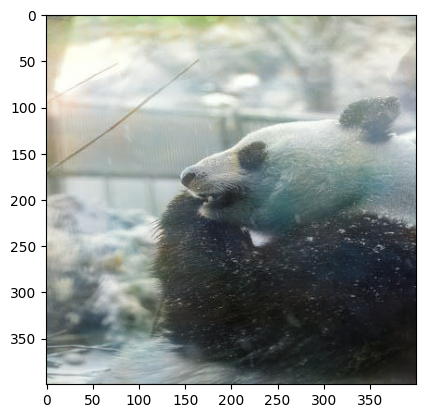

In [30]:
plt.imshow(rgb_img)

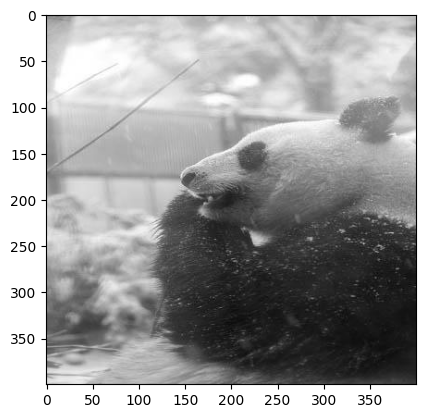

In [31]:
plt.imshow(gray_img, cmap='gray')

In [32]:
# cv2.resize(read_image(f"{TEST_BLACK_DIR}/image5029.jpg").permute(1,2,0).detach().numpy())
# read_image(f"{TEST_BLACK_DIR}/image5029.jpg").permute(1,2,0).detach().numpy()